<img src="Image 1.jpg" width="1050" align="center">

## 1. Importing Libraries

In [5]:

import imgaug as ia                                                      # Library for image augmentation in machine learning experiments                                                         
ia.seed(1)
%matplotlib inline                                                       
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage    # Library for Bounding Box construction for images
from imgaug import augmenters as iaa                                     # Image Augmentator imported as iaa
import imageio                                                           # Image Input/Output Reader
import pandas as pd                                                      # Importing Pandas
import numpy as np                                                       # Importing Numpy
import re
import os                                                                # Importing Operating System for accessing file path and session
import glob                                                              # Used to return all file paths that match a specific pattern
import xml.etree.ElementTree as ET                                       # Represents the whole XML document as a tree
import shutil                                                            # Copy the content of source file to destination file or directory
from PIL import Image                                                    # Invoking the Library of Image
from keras import backend as K                                    
import matplotlib.pyplot as plt                                          # Importing the Library of Matplotlib for Visualization
import cv2                                                               # Importing Computer Vision Tool
 
img_width, img_height = 256, 256

plt.rcParams['figure.figsize'] = [15,8]                                  # Setting a standard figure size of (15,8)

## 2. Feature Extraction

The Images from Accept and Reject directory are accessed for Analysis. Using these images, the following experiments are performed as listed below:
    
- Invoking LabelImg for custom Region of Interest Construction (ROI).
- Using LabelImg, the Region of Interest are plotted and annotations are fetched as XML File
- The annotations along with Image path are converted into CSV File along with its Labels
- Using the coordinates (xmin, xmax, ymin, ymax, height and width) the images are localized and cropped for Accept and Reject Images.
- The cropped image are saved into a Directory.

### 2.1 Accessing Images

Localization is a factor deals with extracting Region of Interest. Using the coordinates fetched through LabelImage, an image is cropped and the resultant are stored in a Directory.

The above method is implemented for both Accept and Reject Images and the resultant cropped images are stored in a Directory.

#### Accept Images

In [6]:
# load images as NumPy arrays and append them to images list

acc_images = []
for index, file in enumerate(glob.glob('C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\ACCEPT\\*.jpg')):
    acc_images.append(imageio.imread(file))
    
# how many images we have
print('We have {} images'.format(len(acc_images)))

We have 237 images


- From the above process, the path of train images are accessed from a Directory using Glob.
- These image are appended into a variable by reading each images in a Directory.

#### Size of an Image

In [7]:
# what are the sizes of the images
for index, file in enumerate(glob.glob('C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\ACCEPT\\*.jpg')):
    print('Image {} have size of {}'.format(file[7:], acc_images[index].shape))

Image s\nabhishe\MITC_Project\train_images_1\ACCEPT\Accapted -20.jpg have size of (4567, 3425, 3)
Image s\nabhishe\MITC_Project\train_images_1\ACCEPT\Accept-A26491-001-Sample - 116-1..jpg have size of (2208, 2944, 3)
Image s\nabhishe\MITC_Project\train_images_1\ACCEPT\Accept-A26491-001-Sample - 118-2..jpg have size of (2435, 3246, 3)
Image s\nabhishe\MITC_Project\train_images_1\ACCEPT\Accept-A26491-001-Sample - 120-1..jpg have size of (2375, 3166, 3)
Image s\nabhishe\MITC_Project\train_images_1\ACCEPT\Accept-A26491-001-Sample - 121-1..jpg have size of (2071, 2761, 3)
Image s\nabhishe\MITC_Project\train_images_1\ACCEPT\Accept-A26491-001-Sample - 121-2..jpg have size of (2462, 3283, 3)
Image s\nabhishe\MITC_Project\train_images_1\ACCEPT\Accept-A26491-001-Sample - 123-1..jpg have size of (2288, 3051, 3)
Image s\nabhishe\MITC_Project\train_images_1\ACCEPT\Accept-A26491-001-Sample - 124-1..jpg have size of (2304, 3073, 3)
Image s\nabhishe\MITC_Project\train_images_1\ACCEPT\Accept-A26491-001

The shape of the Accept Train image are indicated as above.

#### Reject Images

In [8]:
# load images as NumPy arrays and append them to images list
reject_images = []
for index, file in enumerate(glob.glob('C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\REJECT\\*.jpg')):
    reject_images.append(imageio.imread(file))
    
# how many images we have
print('We have {} images'.format(len(reject_images)))

We have 283 images


Similarly Reject image are accessed using Glob and appended into a variable.

The size of each Reject image in a diretory are shown below.

In [9]:
# what are the sizes of the images
for index, file in enumerate(glob.glob('C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\REJECT\\*.jpg')):
    print('Image {} have size of {}'.format(file[7:], reject_images[index].shape))

Image s\nabhishe\MITC_Project\train_images_1\REJECT\Reject-A26491-001-Sample - 1-2..jpg have size of (1830, 2440, 3)
Image s\nabhishe\MITC_Project\train_images_1\REJECT\Reject-A26491-001-Sample - 10-1..jpg have size of (1785, 2379, 3)
Image s\nabhishe\MITC_Project\train_images_1\REJECT\Reject-A26491-001-Sample - 10-2..jpg have size of (1777, 2369, 3)
Image s\nabhishe\MITC_Project\train_images_1\REJECT\Reject-A26491-001-Sample - 100-1.jpg have size of (2038, 2717, 3)
Image s\nabhishe\MITC_Project\train_images_1\REJECT\Reject-A26491-001-Sample - 101-1.jpg have size of (2011, 2681, 3)
Image s\nabhishe\MITC_Project\train_images_1\REJECT\Reject-A26491-001-Sample - 101-2.jpg have size of (2037, 2716, 3)
Image s\nabhishe\MITC_Project\train_images_1\REJECT\Reject-A26491-001-Sample - 102-2.jpg have size of (2147, 2862, 3)
Image s\nabhishe\MITC_Project\train_images_1\REJECT\Reject-A26491-001-Sample - 103-1.jpg have size of (2019, 2692, 3)
Image s\nabhishe\MITC_Project\train_images_1\REJECT\Rejec

#### Sample Images

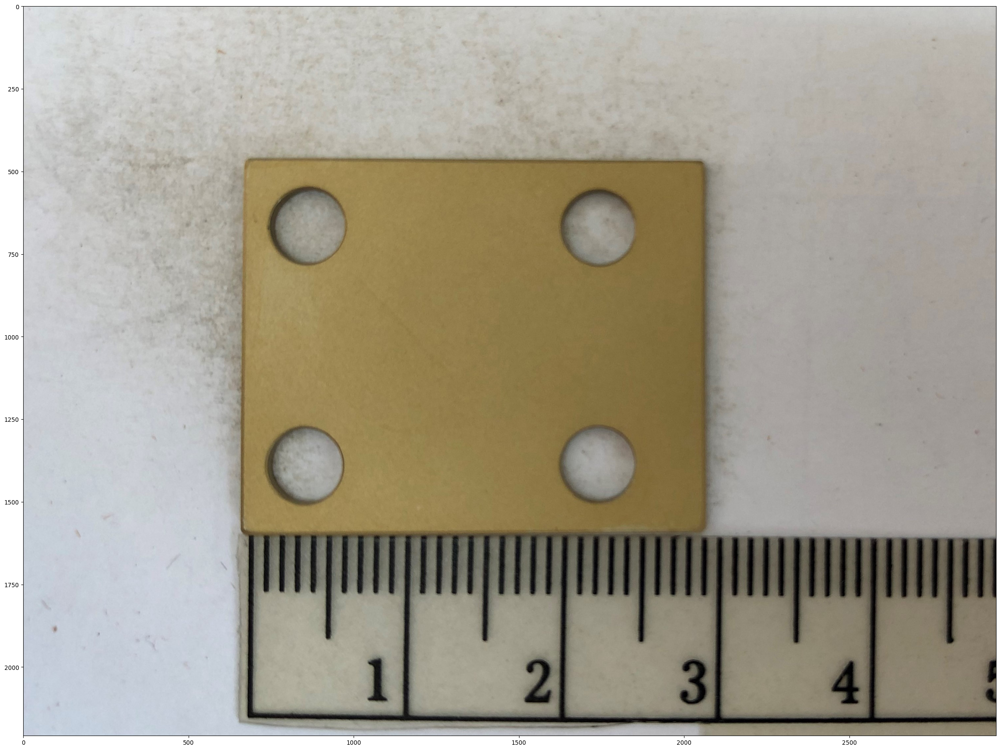

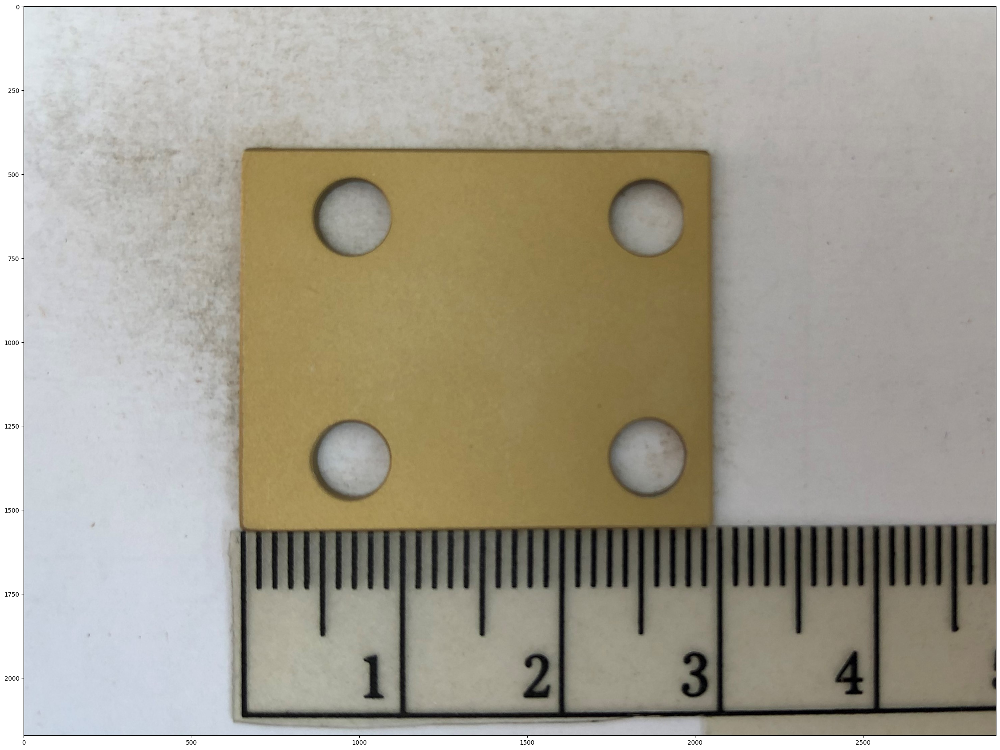

In [10]:
# Have a loook at 2 smaller images
ia.imshow(acc_images[1])
ia.imshow(acc_images[10])

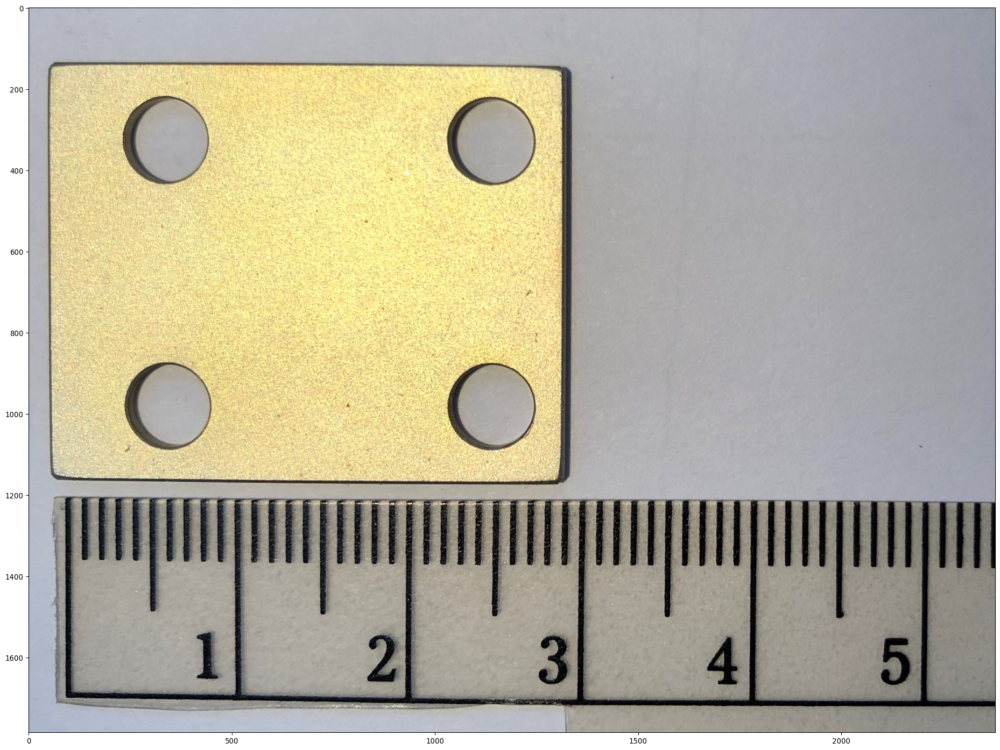

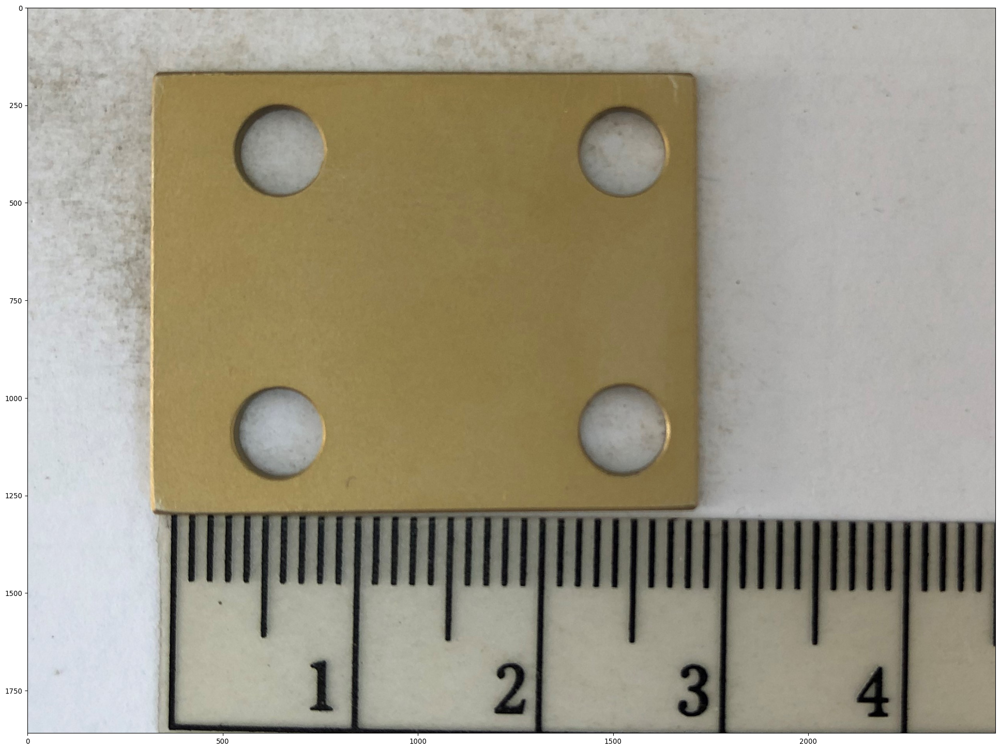

In [11]:
# Have a loook at 2 smaller images
ia.imshow(reject_images[1])
ia.imshow(reject_images[10])

- The above train Accept and Reject images are shown.
- As it is evident that the image consists of plates along with scales.
- The ultimatum is to Localize these plates as Region of Interest (ROI) leaving scale behind.

### 2.2 Localizing using LabelImg

In order to invoke LabelImg using python, it is installed into the system using - !pip install --upgrade pyqt5 lxml

This helps in openeing a LabelImg Tool for Localizing our Region of Interest.

Using Pip list, it will show the packages installed and their versions

In [12]:
pip list

Package                            Version
---------------------------------- -----------------------------------------
absl-py                            0.12.0
ahk                                0.13.0
aiohttp                            3.8.1
aiosignal                          1.2.0
alabaster                          0.7.12
albumentations                     1.1.0
anaconda-client                    1.7.2
anaconda-navigator                 2.0.3
anaconda-project                   0.9.1
analytics-python                   1.4.0
antlr4-python3-runtime             4.8
anyio                              3.5.0
appdirs                            1.4.4
argh                               0.26.2
argon2-cffi                        20.1.0
asgiref                            3.5.0
asn1crypto                         1.4.0
astor                              0.8.1
astroid                            2.5
astropy                            4.2.1
astunparse                         1.6.3
async-generator   

You should consider upgrading via the 'C:\Users\nabhishe\Anaconda3\python.exe -m pip install --upgrade pip' command.



pkginfo                            1.7.0
plotly                             5.4.0
pluggy                             0.13.1
ply                                3.11
portalocker                        2.3.2
progressbar2                       3.55.0
prometheus-client                  0.10.1
promise                            2.3
prompt-toolkit                     3.0.17
protobuf                           3.18.1
psutil                             5.8.0
ptyprocess                         0.7.0
py                                 1.10.0
py-cpuinfo                         8.0.0
py4j                               0.10.9.3
pyasn1                             0.4.8
pyasn1-modules                     0.2.8
pycocotools                        2.0.4
pycodestyle                        2.6.0
pycosat                            0.6.3
pycparser                          2.20
pycryptodome                       3.14.1
pycurl                             7.43.0.6
pydantic                           1.9.0
pydico

- Using "os.path.join", the package for LabelImg is invoked
- A condition is given, whether the package exists or not, if not then make a directory with the same label path.
- LabelImg varies for different OS, hence it is checked whether this Tool is "posix" (Windows) or "nt" (MacOS)

In [13]:
LABELIMG_PATH = os.path.join('labelimg')
# C:\Users\nabhishe\MITC Project

In [14]:
if not os.path.exists(LABELIMG_PATH):
    !mkdir {LABELIMG_PATH}
#    !git clone https://github.com/tzutalin/labelImg {LABELIMG_PATH}

In [15]:
LABELIMG_PATH

'labelimg'

In [16]:
if os.name == 'posix':
    !cd {LABELIMG_PATH} && make qt5py3
if os.name =='nt':
    !cd {LABELIMG_PATH} && pyrcc5 -o libs/resources.py resources.qrc

#### LabelImg performed for Accept Images

- Accessing the path of LABELIMG_PATH, the Tool becomes active and hence we can draw our Localizations using the cursor.
- Moving the cursor an image, it will leverage the area needed for the Analysis and hence the coordinates are fetched (xmin, xmax, ymin, ymax)

Below shows the much needed understanding of the Tool 

In [38]:
# Accept Images
!cd {LABELIMG_PATH} && python labelImg.py              **************

Image:C:\Users\nabhishe\MITC_Project\train_images\ACCEPT\Accept-A26491-001-Sample-81-1.jpg -> Annotation:C:/Users/nabhishe/MITC_Project/train_images/ACCEPT/Accept-A26491-001-Sample-81-1.xml
Image:C:\Users\nabhishe\MITC_Project\train_images\ACCEPT\Accept-A26491-001-Sample-81-2.jpg -> Annotation:C:/Users/nabhishe/MITC_Project/train_images/ACCEPT/Accept-A26491-001-Sample-81-2.xml
Image:C:\Users\nabhishe\MITC_Project\train_images\ACCEPT\Accept-A26491-001-Sample-82-1.jpg -> Annotation:C:/Users/nabhishe/MITC_Project/train_images/ACCEPT/Accept-A26491-001-Sample-82-1.xml
Image:C:\Users\nabhishe\MITC_Project\train_images\ACCEPT\Accept-A26491-001-Sample-82-2.jpg -> Annotation:C:/Users/nabhishe/MITC_Project/train_images/ACCEPT/Accept-A26491-001-Sample-82-2.xml
Image:C:\Users\nabhishe\MITC_Project\train_images\ACCEPT\Accept-A26491-001-Sample-83-1.jpg -> Annotation:C:/Users/nabhishe/MITC_Project/train_images/ACCEPT/Accept-A26491-001-Sample-83-1.xml
Image:C:\Users\nabhishe\MITC_Project\train_images\

<img src="Image 2.png" width="750" align="center">

#### LabelImg performed for Reject Images

Similar to Accept is the implemention for Reject Images where the Tool is invoked and we get the leverage to draw our Region of Interest (ROI).

Below shows the much needed understanding of the Tool

In [15]:
# Reject Images
!cd {LABELIMG_PATH} && python labelImg.py              

Image:C:\Users\nabhishe\MITC_Project\train_images\REJECT\Reject-A26491-001-Sample - 156-2..jpg -> Annotation:C:/Users/nabhishe/MITC_Project/train_images/REJECT/Reject-A26491-001-Sample - 156-2..xml
Image:C:\Users\nabhishe\MITC_Project\train_images\REJECT\Reject-A26491-001-Sample - 157-1..jpg -> Annotation:C:/Users/nabhishe/MITC_Project/train_images/REJECT/Reject-A26491-001-Sample - 157-1..xml
Image:C:\Users\nabhishe\MITC_Project\train_images\REJECT\Reject-A26491-001-Sample - 157-2..jpg -> Annotation:C:/Users/nabhishe/MITC_Project/train_images/REJECT/Reject-A26491-001-Sample - 157-2..xml
Image:C:\Users\nabhishe\MITC_Project\train_images\REJECT\Reject-A26491-001-Sample - 158-1..jpg -> Annotation:C:/Users/nabhishe/MITC_Project/train_images/REJECT/Reject-A26491-001-Sample - 158-1..xml
Image:C:\Users\nabhishe\MITC_Project\train_images\REJECT\Reject-A26491-001-Sample - 158-2..jpg -> Annotation:C:/Users/nabhishe/MITC_Project/train_images/REJECT/Reject-A26491-001-Sample - 158-2..xml
Image:C:\U

<img src="Image 3.png" width="750" align="center">

### 2.3 XML and Annotations

The XML File is created for every localization on the image. Once the coordinates are fetched for each image, the annotaions are generated and saved in a directory.

The Annotation for Accept and Reject images generated are shown below.

#### Accept XML Files

In [9]:
# Accept XML Files
for index, file in enumerate(glob.glob('C:\\Users\\nabhishe\\MITC_Project\\XML_File\\Accept_Images\\*.xml')):
    print(file[7:])

s\nabhishe\MITC_Project\XML_File\Accept_Images\Accapted -20.xml
s\nabhishe\MITC_Project\XML_File\Accept_Images\Accept-A26491-001-Sample - 116-1..xml
s\nabhishe\MITC_Project\XML_File\Accept_Images\Accept-A26491-001-Sample - 118-2..xml
s\nabhishe\MITC_Project\XML_File\Accept_Images\Accept-A26491-001-Sample - 120-1..xml
s\nabhishe\MITC_Project\XML_File\Accept_Images\Accept-A26491-001-Sample - 121-1..xml
s\nabhishe\MITC_Project\XML_File\Accept_Images\Accept-A26491-001-Sample - 121-2..xml
s\nabhishe\MITC_Project\XML_File\Accept_Images\Accept-A26491-001-Sample - 123-1..xml
s\nabhishe\MITC_Project\XML_File\Accept_Images\Accept-A26491-001-Sample - 124-1..xml
s\nabhishe\MITC_Project\XML_File\Accept_Images\Accept-A26491-001-Sample - 124-2..xml
s\nabhishe\MITC_Project\XML_File\Accept_Images\Accept-A26491-001-Sample - 125-2..xml
s\nabhishe\MITC_Project\XML_File\Accept_Images\Accept-A26491-001-Sample - 44-1..xml
s\nabhishe\MITC_Project\XML_File\Accept_Images\Accept-A26491-001-Sample - 52-2..xml
s\n

#### Reject XML Files

In [10]:
# Reject XML Files
for index, file in enumerate(glob.glob('C:\\Users\\nabhishe\\MITC_Project\\XML_File\\Reject_Images\\*.xml')):
    print(file[7:])

s\nabhishe\MITC_Project\XML_File\Reject_Images\Reject-A26491-001-Sample - 1-2..xml
s\nabhishe\MITC_Project\XML_File\Reject_Images\Reject-A26491-001-Sample - 10-1..xml
s\nabhishe\MITC_Project\XML_File\Reject_Images\Reject-A26491-001-Sample - 10-2..xml
s\nabhishe\MITC_Project\XML_File\Reject_Images\Reject-A26491-001-Sample - 100-1.xml
s\nabhishe\MITC_Project\XML_File\Reject_Images\Reject-A26491-001-Sample - 101-1.xml
s\nabhishe\MITC_Project\XML_File\Reject_Images\Reject-A26491-001-Sample - 101-2.xml
s\nabhishe\MITC_Project\XML_File\Reject_Images\Reject-A26491-001-Sample - 102-2.xml
s\nabhishe\MITC_Project\XML_File\Reject_Images\Reject-A26491-001-Sample - 103-1.xml
s\nabhishe\MITC_Project\XML_File\Reject_Images\Reject-A26491-001-Sample - 103-2.xml
s\nabhishe\MITC_Project\XML_File\Reject_Images\Reject-A26491-001-Sample - 104-2.xml
s\nabhishe\MITC_Project\XML_File\Reject_Images\Reject-A26491-001-Sample - 105-1.xml
s\nabhishe\MITC_Project\XML_File\Reject_Images\Reject-A26491-001-Sample - 107

From the above observation, we can see that the annotations are generated for Accept and Reject in seperate Directory.

#### Example of Annotation

The cell below shows an example in which an Annotation looks like.

In [26]:
# XML File Annotation
shutil.copy('C:\\Users\\nabhishe\\MITC_Project\\XML File\\Accept_XML\\Accept-A26491-001-Sample - 117-1..xml', 'C:\\Users\\nabhishe\\MITC_Project\\XML File\\Accept_XML\\Accept-A26491-001-Sample - 117-1..txt')
annotation_text = open("C:\\Users\\nabhishe\\MITC_Project\\XML File\\Accept_XML\\Accept-A26491-001-Sample - 117-1..txt", "r")
print(annotation_text.read())
annotation_text.close()

<annotation>
	<folder>ACCEPT</folder>
	<filename>Accept-A26491-001-Sample - 117-1..jpg</filename>
	<path>C:\Users\nabhishe\MITC_Project\train_images\ACCEPT\Accept-A26491-001-Sample - 117-1..jpg</path>
	<source>
		<database>Unknown</database>
	</source>
	<size>
		<width>2827</width>
		<height>2120</height>
		<depth>3</depth>
	</size>
	<segmented>0</segmented>
	<object>
		<name>Accept</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>656</xmin>
			<ymin>427</ymin>
			<xmax>2066</xmax>
			<ymax>1575</ymax>
		</bndbox>
	</object>
</annotation>



The following details are fetched in Annotation file:
- <b>Folder</b> - Indicates what class of image it is directed towards
- <b>Filename</b> - Name of the File
- <b>Path</b> - Indicates the path of the file it is saved.
- <b>Width, Height, Depth</b> - Values of image Width, Height and Depth
- <b>bndbox (xmin, ymin, xmax, ymax)</b> - indicates the value of 4 point coordinates

### 2.4 XML to CSV

The XML Results are converted into CSV file along with the labels.

The below code execution is the implementation of the XML to CSV Conversion

In [11]:
def xml_to_csv(path):
    xml_list = []
    for xml_file in glob.glob(path + '/*.xml'):
        tree = ET.parse(xml_file)
        root = tree.getroot()
        for member in root.findall('object'):
            value = (root.find('filename').text,
                     int(root.find('size')[0].text),
                     int(root.find('size')[1].text),
                     member[0].text,
                     int(member[4][0].text),
                     int(member[4][1].text),
                     int(member[4][2].text),
                     int(member[4][3].text)
                     )
            xml_list.append(value)
    column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df

- A function is assigned as xml_to_csv.
- Using Glob, the XML path are accessed.
- ET.parse helps in accessing XML File and store.
- Using tree.getroot will help in forming a tree of XML Objects.
- The root will fetch all the object from XML file and converted as text.
- As per the Annotation, the Path, Image File name, Height, Width and all 4 coordinates are accessed.
- These results are appended into a variable and transformed into a DataFrame.
- Column names are assigned while constructing a DataFrame.

#### Accept DataFrame

Upon building a DataFrame, it is converted into a CSV file using a python in-built function "to_csv" as shown below

In [12]:
# apply xml_to_csv() function to convert all XML files in images/ folder into labels.csv

# Accept Images
accept_df = xml_to_csv('C:\\Users\\nabhishe\\MITC_Project\\XML_File\\Accept_Images\\')
accept_df.to_csv(('acc_labels.csv'), index=None)
print('Successfully converted xml to csv.')

Successfully converted xml to csv.


The below DataFrame is an example of how a CSV File looks like after transformation

In [13]:
accept_df.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,Accapted -20.jpg,3425,4567,Accept,339,923,2991,3039
1,Accept-A26491-001-Sample - 116-1..jpg,2944,2208,Accept,661,459,2074,1605
2,Accept-A26491-001-Sample - 118-2..jpg,3246,2435,Accept,696,683,2109,1824
3,Accept-A26491-001-Sample - 120-1..jpg,3166,2375,Accept,551,638,1956,1780
4,Accept-A26491-001-Sample - 121-1..jpg,2761,2071,Accept,424,357,1836,1497


In [14]:
accept_df.shape

(237, 8)

Using os.listdir the train images are accessed and a DataFrame is created. The resultant DataFrame consists of single column with path of each Accept image in the Directory

In [15]:
import os

files_in_accept = sorted(os.listdir('C:\\Users\\nabhishe\\MITC_Project\\train_images_1\ACCEPT\\'))
#files_in_annotated = sorted(os.listdir(validation_generator))

images=[i for i in files_in_accept]

accept_df1 = pd.DataFrame()
accept_df1['accept_images']=['C:\\Users\\nabhishe\\MITC_Project\\train_images_1\ACCEPT\\'+str(x) for x in images]
accept_df1['accept_images']

accept_df1.to_csv(('accept_csv.csv'), header=None)

In [16]:
accept_df1.head()

,accept_images
0,C:\Users\nabhishe\MITC_Project\train_images_1\...
1,C:\Users\nabhishe\MITC_Project\train_images_1\...
2,C:\Users\nabhishe\MITC_Project\train_images_1\...
3,C:\Users\nabhishe\MITC_Project\train_images_1\...
4,C:\Users\nabhishe\MITC_Project\train_images_1\...


In [17]:
accept_df1.shape

(237, 1)

Considering the above two DataFrames, the results are concatenated as shown below.

In [18]:
acc_csv = pd.concat([accept_df1,accept_df],axis=1)
acc_csv = acc_csv.drop(columns='filename',axis=1)
acc_csv.head()

,accept_images,width,height,class,xmin,ymin,xmax,ymax
0,C:\Users\nabhishe\MITC_Project\train_images_1\...,3425,4567,Accept,339,923,2991,3039
1,C:\Users\nabhishe\MITC_Project\train_images_1\...,2944,2208,Accept,661,459,2074,1605
2,C:\Users\nabhishe\MITC_Project\train_images_1\...,3246,2435,Accept,696,683,2109,1824
3,C:\Users\nabhishe\MITC_Project\train_images_1\...,3166,2375,Accept,551,638,1956,1780
4,C:\Users\nabhishe\MITC_Project\train_images_1\...,2761,2071,Accept,424,357,1836,1497


In [19]:
acc_csv = acc_csv.iloc[:,[0,1,2,4,5,6,7,3]]
acc_csv.head()

,accept_images,width,height,xmin,ymin,xmax,ymax,class
0,C:\Users\nabhishe\MITC_Project\train_images_1\...,3425,4567,339,923,2991,3039,Accept
1,C:\Users\nabhishe\MITC_Project\train_images_1\...,2944,2208,661,459,2074,1605,Accept
2,C:\Users\nabhishe\MITC_Project\train_images_1\...,3246,2435,696,683,2109,1824,Accept
3,C:\Users\nabhishe\MITC_Project\train_images_1\...,3166,2375,551,638,1956,1780,Accept
4,C:\Users\nabhishe\MITC_Project\train_images_1\...,2761,2071,424,357,1836,1497,Accept


In [20]:
# converting to csv
acc_csv.to_csv(('acc_final.csv'), header=None,index=False)

The Final results are converted into CSV File.

#### Reject DataFrame

Similar to Accept Images, similar implementations are carried out for Reject DataFrame. Below shows the conversion of the results from LabelImg into DataFrame

In [21]:
# apply xml_to_csv() function to convert all XML files in images/ folder into labels.csv

# Reject Images
reject_df = xml_to_csv('C:\\Users\\nabhishe\\MITC_Project\\XML_File\\Reject_Images\\')
reject_df.to_csv(('reject_labels.csv'), index=None)
print('Successfully converted xml to csv.')

Successfully converted xml to csv.


In [22]:
reject_df.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,Reject-A26491-001-Sample - 1-2..jpg,2440,1830,Reject,261,85,1669,1212
1,Reject-A26491-001-Sample - 10-1..jpg,2379,1785,Reject,46,128,1338,1175
2,Reject-A26491-001-Sample - 10-2..jpg,2369,1777,Reject,114,158,1406,1195
3,Reject-A26491-001-Sample - 100-1.jpg,2717,2038,Reject,356,315,1749,1442
4,Reject-A26491-001-Sample - 101-1.jpg,2681,2011,Reject,296,306,1674,1422


In [23]:
reject_df.shape

(283, 8)

In [24]:
import os

files_in_accept = sorted(os.listdir('C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\REJECT\\'))

# C:\Users\nabhishe\MITC_Project\train_images\REJECT
#files_in_annotated = sorted(os.listdir(validation_generator))

images=[i for i in files_in_accept]

reject_df1 = pd.DataFrame()
reject_df1['reject_images']=['C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\REJECT\\'+str(x) for x in images]
reject_df1['reject_images']

reject_df1.to_csv(('reject_csv.csv'), header=None)

In [25]:
reject_df1.head()

,reject_images
0,C:\Users\nabhishe\MITC_Project\train_images_1\...
1,C:\Users\nabhishe\MITC_Project\train_images_1\...
2,C:\Users\nabhishe\MITC_Project\train_images_1\...
3,C:\Users\nabhishe\MITC_Project\train_images_1\...
4,C:\Users\nabhishe\MITC_Project\train_images_1\...


In [26]:
reject_df1.shape

(283, 1)

In [27]:
reject_csv = pd.concat([reject_df1,reject_df],axis=1)
reject_csv = reject_csv.drop(columns='filename',axis=1)
reject_csv.head()

,reject_images,width,height,class,xmin,ymin,xmax,ymax
0,C:\Users\nabhishe\MITC_Project\train_images_1\...,2440,1830,Reject,261,85,1669,1212
1,C:\Users\nabhishe\MITC_Project\train_images_1\...,2379,1785,Reject,46,128,1338,1175
2,C:\Users\nabhishe\MITC_Project\train_images_1\...,2369,1777,Reject,114,158,1406,1195
3,C:\Users\nabhishe\MITC_Project\train_images_1\...,2717,2038,Reject,356,315,1749,1442
4,C:\Users\nabhishe\MITC_Project\train_images_1\...,2681,2011,Reject,296,306,1674,1422


In [28]:
reject_csv = reject_csv.iloc[:,[0,1,2,4,5,6,7,3]]
reject_csv.head()

,reject_images,width,height,xmin,ymin,xmax,ymax,class
0,C:\Users\nabhishe\MITC_Project\train_images_1\...,2440,1830,261,85,1669,1212,Reject
1,C:\Users\nabhishe\MITC_Project\train_images_1\...,2379,1785,46,128,1338,1175,Reject
2,C:\Users\nabhishe\MITC_Project\train_images_1\...,2369,1777,114,158,1406,1195,Reject
3,C:\Users\nabhishe\MITC_Project\train_images_1\...,2717,2038,356,315,1749,1442,Reject
4,C:\Users\nabhishe\MITC_Project\train_images_1\...,2681,2011,296,306,1674,1422,Reject


In [29]:
# converting to csv
reject_csv.to_csv(('reject_final.csv'), header=None,index=False)

### 2.5 Image Cropping

Since the coordinates of the Images are stored in a CSV File, using them an image is Localized and cropped as an Image. 

Below two directories are created for Accept and Reject and the Cropped will be saved in them.

In [30]:
# Creating a Accept Cropped image Directory

CROPPED_PATH = os.path.join('cropped_images1','Accept_Cropped')
# C:\Users\nabhishe\MITC Project

In [31]:
# Creating a Reject Cropped image Directory

CROPPED_PATH = os.path.join('cropped_images1','Reject_Cropped')
# C:\Users\nabhishe\MITC Project

In [32]:
if not os.path.exists(CROPPED_PATH):
    !mkdir {CROPPED_PATH}

#### Accessing the Path

The CSV File is accessed and vital implementation is taken care as shown below.

In [33]:
project_path = 'C:\\Users\\nabhishe\\MITC_Project\\'

In [34]:
CROP_ACCEPT_CSV = project_path + "acc_final.csv"

In [35]:
CROP_ACCEPT_CSV

'C:\\Users\\nabhishe\\MITC_Project\\acc_final.csv'

In [36]:
import numpy as np
import csv

IMAGE_SIZE = 128                            # Image sizes can vary (128, 160, 192, 224). MobileNetV2 can also take 96

with open(CROP_ACCEPT_CSV, "r") as f:
    y_acc_crop = np.zeros((sum(1 for line in f), 4))
    X_acc_crop = []
    f.seek(0)
    data = csv.reader(f)
    for index, row in enumerate(data):
        for i, r in enumerate(row[1:7]):
            row[i+1] = int(r)
        path, image_width, image_height,x0, y0, x1, y1, _ = row       # Read image, its dimensions, BBox coords
    
        # C:\Users\nabhishe\MITC_Project\train_images\ACCEPTAccept-A26491-001-Sample-49-1.jpg
    
        path =  path.split("\\")[-7] + "\\" + path.split("\\")[-6] + "\\" + path.split("\\")[-5] + "\\" + path.split("\\")[-4] + "\\" + path.split("\\")[-3] + "\\" + path.split("\\")[-2] + "\\" + path.split("\\")[-1]
        #path = path.split("\\")[-2] + "\\" + path.split("\\")[-1]
        y_acc_crop[index, 0] = x0 * IMAGE_SIZE / image_width                 # Normalize bounding box by image size
        y_acc_crop[index, 1] = y0 * IMAGE_SIZE / image_height                # Normalize bounding box by image size
        y_acc_crop[index, 2] = (x1 - x0) * IMAGE_SIZE / image_width          # Normalize bounding box by image size
        y_acc_crop[index, 3] = (y1 - y0) * IMAGE_SIZE / image_height         # Normalize bounding box by image size

        X_acc_crop.append(path)     

Implementation of code:
- The CSV File is read with an open statement.
- In this CSV File, the image path is accessed with a split on "\\" sign.
- Along with path, the coordinates (xmin, ymin, xmax, ymax, height and width) are accessed. 
- The above step is implemented to fetch the Bounding Box to Localize Region of Interest (ROI).
- Point 1 - xmin * Image_Size / Image_width

  Point 2 - ymin * Image_Size / Image_Height
  
  Point 3 - (xmax - xmin) * Image_Size / Image_Width
  
  Point 4 - (ymax - ymin) * Image_Size / Image_Height
  
The resultant path of the Image fetched are shown below as a sample.

In [37]:
print(len(X_acc_crop))
X_acc_crop[:5]

237


['C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\ACCEPT\\Accapted -20.jpg',
 'C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\ACCEPT\\Accept-A26491-001-Sample - 116-1..jpg',
 'C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\ACCEPT\\Accept-A26491-001-Sample - 118-2..jpg',
 'C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\ACCEPT\\Accept-A26491-001-Sample - 120-1..jpg',
 'C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\ACCEPT\\Accept-A26491-001-Sample - 121-1..jpg']

In [38]:
X_acc_crop[200]

'C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\ACCEPT\\Accept-A26491-001-Sample-92-1.jpg'

In [47]:
y_acc_crop[200]

array([20.90707263, 34.86971235, 57.03774183, 61.07614213])

From above it is evident that for a particular image, the path is fetched with the 4 point Bounding Box Coordinates.

The array above consists of 4 Point Bounding Box Coordinates of a particular Image

#### Checking a Data

Using the above implementation, a sample image is taken for testing how a resultant Bounding Box looks after calculating its coordinates

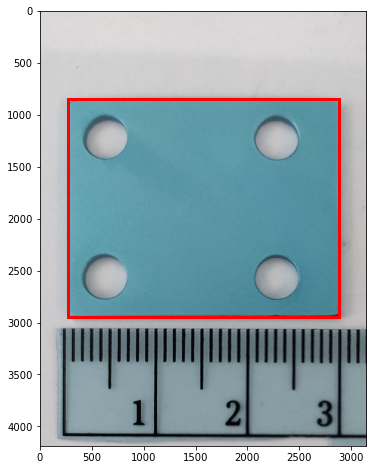

In [48]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Pick a random image to check how it looks
filename = X_acc_crop[230]

unscaled = cv2.imread(filename)
region = y_acc_crop[230]
image_height, image_width, _ = unscaled.shape

x0 = int(region[0] * image_width / IMAGE_SIZE) # Scale the BBox
y0 = int(region[1] * image_height / IMAGE_SIZE)

x1 = int((region[0] + region[2]) * image_width / IMAGE_SIZE)
y1 = int((region[1] + region[3]) * image_height / IMAGE_SIZE)

# Create figure and axes
fig,ax = plt.subplots(1)

# Display the image
ax.imshow(unscaled)

# Create a Rectangle patch
rect = patches.Rectangle((x0, y0), x1 - x0, y1 - y0, linewidth=3, edgecolor='r', facecolor='none')

# Add the patch to the Axes
ax.add_patch(rect)

plt.show()

From above the Bounding Box is constructed using the 4 coordinates from the CSV File.

Further it is extracted and saved as an image into a Directory

In [49]:
unscaled.shape

(4187, 3139, 3)

In [50]:
print(x0, y0, (x1-x0),(y1-y0))   # x, y, w, h

269 848 2610 2100


For a sample image, above are the coordinates fetched for Cropping.

#### Cropping a sample Accept Image

The coordinates are used for the above sample image for Cropping using a Formulae as shown below:
    
img[ymin:(ymin+(ymax-ymin)), xmax:(xmin+(xmax-xmin))]

<class 'numpy.ndarray'>
Shape of the image (4187, 3139, 3)
Shape of the cropped image (2100, 2610, 3)


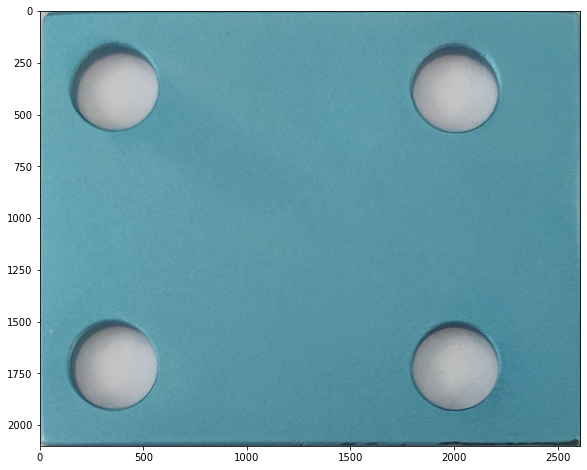

In [52]:
import cv2
  
img = cv2.imread("C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\ACCEPT\\Accepted-23.jpg")
print(type(img))
  
# Shape of the image
print("Shape of the image", img.shape)
# [rows, columns]
crop = img[y0:(y0+(y1-y0)), x0:(x0+(x1 - x0))]    # 460 314 1376 1107     img[y:y+h, x:x+w]

  
plt.imshow(crop)

print("Shape of the cropped image", crop.shape)

Thus the resultant image above is a Cropped Region which will be used for our Analysis.

Similarly all the images in Accept Directory are cropped and saved as an image in a different Directory.

#### Cropping all the Images in the Accept csv

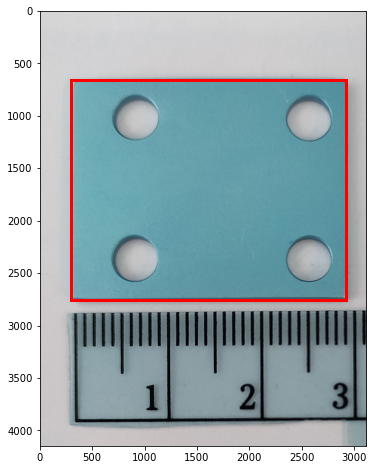

In [68]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Pick a random image to check how it looks
filename = X_acc_crop[220]

unscaled = cv2.imread(filename)
region = y_acc_crop[220]
image_height, image_width, _ = unscaled.shape

x0 = int(region[0] * image_width / IMAGE_SIZE) # Scale the BBox
y0 = int(region[1] * image_height / IMAGE_SIZE)

x1 = int((region[0] + region[2]) * image_width / IMAGE_SIZE)
y1 = int((region[1] + region[3]) * image_height / IMAGE_SIZE)

# Create figure and axes
fig,ax = plt.subplots(1)

# Display the image
ax.imshow(unscaled)

# Create a Rectangle patch
rect = patches.Rectangle((x0, y0), x1 - x0, y1 - y0, linewidth=3, edgecolor='r', facecolor='none')

# Add the patch to the Axes
ax.add_patch(rect)

plt.show()

In [69]:
X_acc_crop[220]

'C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\ACCEPT\\Accepted -3.jpg'

<class 'numpy.ndarray'>
Shape of the image (4147, 3110, 3)
Shape of the cropped image (2099, 2619, 3)


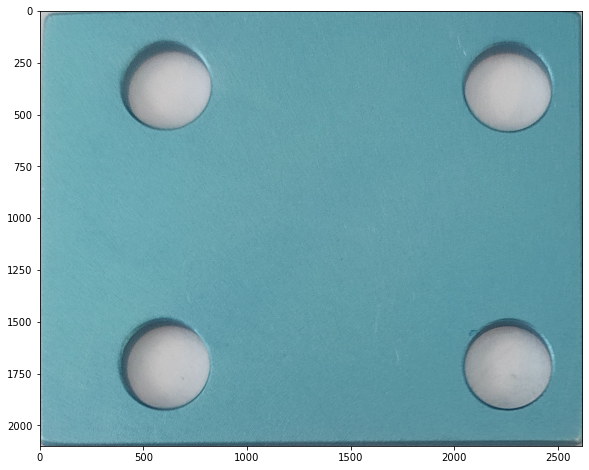

In [70]:
import cv2
  
img = cv2.imread('C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\ACCEPT\\Accepted -3.jpg')
print(type(img))
  
# Shape of the image
print("Shape of the image", img.shape)
# [rows, columns]
crop = img[y0:(y0+(y1-y0)), x0:(x0+(x1 - x0))]    # 460 314 1376 1107     img[y:y+h, x:x+w]
  
plt.imshow(crop)

print("Shape of the cropped image", crop.shape)

In [122]:
result=cv2.imwrite('C:\\Users\\nabhishe\\MITC_Project\\cropped_images1\\Accept_Cropped\\Accepted -16.jpg', crop)
if result==True:
    print('File saved successfully')
else:
    print('Error in saving file')

File saved successfully


#### Cropping a Sample Reject Images

All the steps briefed above for Accept Images are similarly applicable for the implementation on Reject Images.

- An Image is taken and using the 4 point coordinates (xmin, ymin, xmax, ymax) are used and calculated

  Point 1 - xmin * Image_Size / Image_width

  Point 2 - ymin * Image_Size / Image_Height

  Point 3 - (xmax - xmin) * Image_Size / Image_Width

  Point 4 - (ymax - ymin) * Image_Size / Image_Height

In [39]:
project_path = 'C:\\Users\\nabhishe\\MITC_Project\\'

In [40]:
CROP_REJECT_CSV = project_path + "reject_final.csv"

In [41]:
CROP_REJECT_CSV

'C:\\Users\\nabhishe\\MITC_Project\\reject_final.csv'

In [42]:
import numpy as np
import csv

IMAGE_SIZE = 128                            # Image sizes can vary (128, 160, 192, 224). MobileNetV2 can also take 96

with open(CROP_REJECT_CSV, "r") as f:
    y_rej_crop = np.zeros((sum(1 for line in f), 4))
    X_rej_crop = []
    f.seek(0)
    data = csv.reader(f)
    for index, row in enumerate(data):
        for i, r in enumerate(row[1:7]):
            row[i+1] = int(r)
        path, image_width, image_height,x0, y0, x1, y1, _ = row       # Read image, its dimensions, BBox coords
    
        # C:\Users\nabhishe\MITC_Project\train_images\ACCEPTAccept-A26491-001-Sample-49-1.jpg
    
        path =  path.split("\\")[-7] + "\\" + path.split("\\")[-6] + "\\" + path.split("\\")[-5] + "\\" + path.split("\\")[-4] + "\\" + path.split("\\")[-3] + "\\" + path.split("\\")[-2] + "\\" + path.split("\\")[-1]
        #path = path.split("\\")[-2] + "\\" + path.split("\\")[-1]
        y_rej_crop[index, 0] = x0 * IMAGE_SIZE / image_width                 # Normalize bounding box by image size
        y_rej_crop[index, 1] = y0 * IMAGE_SIZE / image_height                # Normalize bounding box by image size
        y_rej_crop[index, 2] = (x1 - x0) * IMAGE_SIZE / image_width          # Normalize bounding box by image size
        y_rej_crop[index, 3] = (y1 - y0) * IMAGE_SIZE / image_height         # Normalize bounding box by image size

        X_rej_crop.append(path)     

In [43]:
print(len(X_rej_crop))
X_rej_crop[:5]

283


['C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\REJECT\\Reject-A26491-001-Sample - 1-2..jpg',
 'C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\REJECT\\Reject-A26491-001-Sample - 10-1..jpg',
 'C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\REJECT\\Reject-A26491-001-Sample - 10-2..jpg',
 'C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\REJECT\\Reject-A26491-001-Sample - 100-1.jpg',
 'C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\REJECT\\Reject-A26491-001-Sample - 101-1.jpg']

In [44]:
X_rej_crop[200]

'C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\REJECT\\Reject-A26491-001-Sample - 52-2..jpg'

In [45]:
y_rej_crop[200]

array([ 4.07609595, 12.41896362, 69.02894955, 74.93715546])

#### Checking a Data

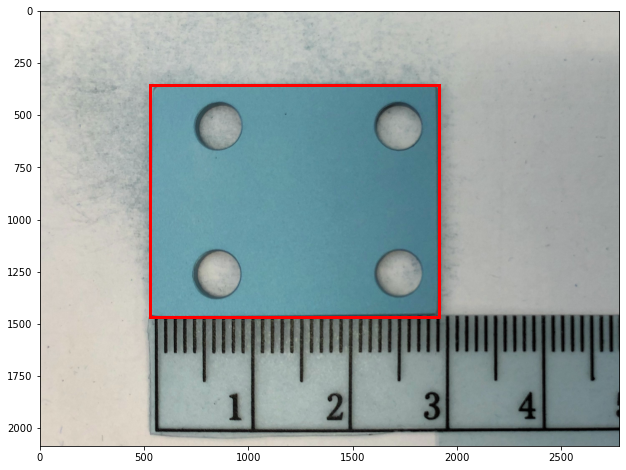

In [46]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Pick a random image to check how it looks
filename = X_rej_crop[100]

unscaled = cv2.imread(filename)
region = y_rej_crop[100]
image_height, image_width, _ = unscaled.shape

x0 = int(region[0] * image_width / IMAGE_SIZE) # Scale the BBox
y0 = int(region[1] * image_height / IMAGE_SIZE)

x1 = int((region[0] + region[2]) * image_width / IMAGE_SIZE)
y1 = int((region[1] + region[3]) * image_height / IMAGE_SIZE)

# Create figure and axes
fig,ax = plt.subplots(1)

# Display the image
ax.imshow(unscaled)

# Create a Rectangle patch
rect = patches.Rectangle((x0, y0), x1 - x0, y1 - y0, linewidth=3, edgecolor='r', facecolor='none')

# Add the patch to the Axes
ax.add_patch(rect)

plt.show()

In [61]:
unscaled.shape

(2085, 2779, 3)

In [62]:
print(x0, y0, (x1-x0),(y1-y0))   # x, y, w, h

526 357 1389 1110


In [63]:
X_rej_crop[100]

'C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\REJECT\\Reject-A26491-001-Sample - 159-2..jpg'

#### Cropping a sample Image

<class 'numpy.ndarray'>
Shape of the image (2085, 2779, 3)
Shape of the cropped image (1110, 1389, 3)


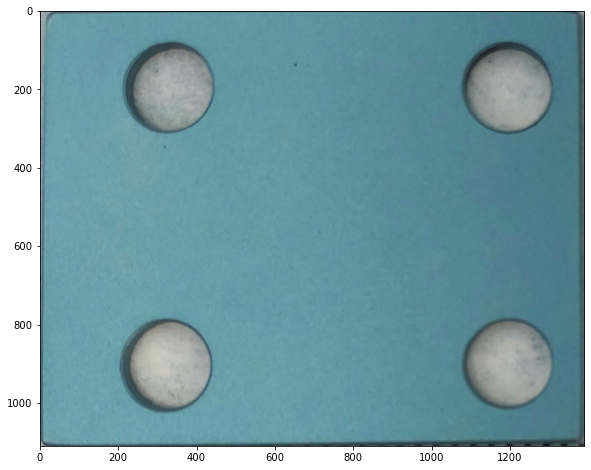

In [64]:
import cv2
  
img = cv2.imread("C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\REJECT\\Reject-A26491-001-Sample - 159-2..jpg")
print(type(img))
  
# Shape of the image
print("Shape of the image", img.shape)
# [rows, columns]
crop = img[y0:(y0+(y1-y0)), x0:(x0+(x1 - x0))]    # 460 314 1376 1107     img[y:y+h, x:x+w]

  
plt.imshow(crop)

print("Shape of the cropped image", crop.shape)

#### Cropping all the Images in the Reject csv

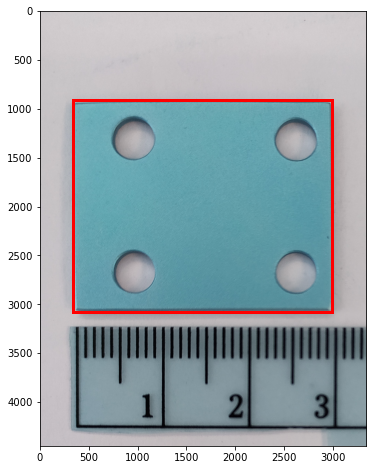

In [85]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Pick a random image to check how it looks
filename = X_rej_crop[280]                            

unscaled = cv2.imread(filename)
region = y_rej_crop[280]
image_height, image_width, _ = unscaled.shape

x0 = int(region[0] * image_width / IMAGE_SIZE) # Scale the BBox
y0 = int(region[1] * image_height / IMAGE_SIZE)

x1 = int((region[0] + region[2]) * image_width / IMAGE_SIZE)
y1 = int((region[1] + region[3]) * image_height / IMAGE_SIZE)

# Create figure and axes
fig,ax = plt.subplots(1)

# Display the image
ax.imshow(unscaled)

# Create a Rectangle patch
rect = patches.Rectangle((x0, y0), x1 - x0, y1 - y0, linewidth=3, edgecolor='r', facecolor='none')

# Add the patch to the Axes
ax.add_patch(rect)

plt.show()

In [86]:
X_rej_crop[280]

'C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\REJECT\\Rejected -3.jpg'

<class 'numpy.ndarray'>
Shape of the image (4447, 3336, 3)
Shape of the cropped image (2165, 2650, 3)


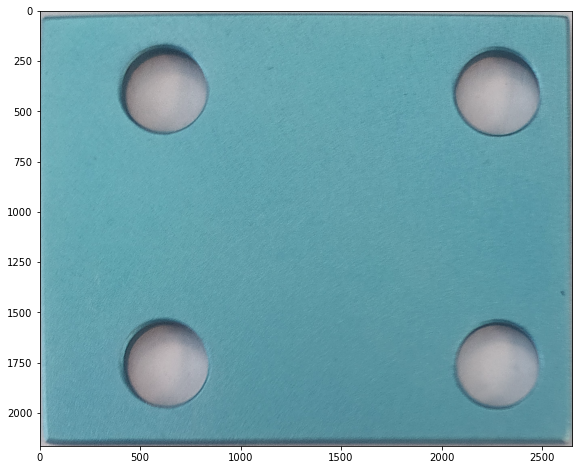

In [87]:
import cv2
  
img = cv2.imread('C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\REJECT\\Rejected -3.jpg')
print(type(img))
  
# Shape of the image
print("Shape of the image", img.shape)
# [rows, columns]
crop = img[y0:(y0+(y1-y0)), x0:(x0+(x1 - x0))]    # 460 314 1376 1107     img[y:y+h, x:x+w]
  
plt.imshow(crop)

print("Shape of the cropped image", crop.shape)

In [413]:
result=cv2.imwrite('C:\\Users\\nabhishe\\MITC_Project\\cropped_images\\Reject_Cropped\\Rejected-7.jpg', crop)
if result==True:
    print('File saved successfully')
else:
    print('Error in saving file')

File saved successfully


In [ ]:
######################################  ------END---------  ########################################

### Final Merged Images

In [ ]:
The results 

In [47]:
d1 = acc_csv.copy()
d1.head()

,accept_images,width,height,xmin,ymin,xmax,ymax,class
0,C:\Users\nabhishe\MITC_Project\train_images_1\...,3425,4567,339,923,2991,3039,Accept
1,C:\Users\nabhishe\MITC_Project\train_images_1\...,2944,2208,661,459,2074,1605,Accept
2,C:\Users\nabhishe\MITC_Project\train_images_1\...,3246,2435,696,683,2109,1824,Accept
3,C:\Users\nabhishe\MITC_Project\train_images_1\...,3166,2375,551,638,1956,1780,Accept
4,C:\Users\nabhishe\MITC_Project\train_images_1\...,2761,2071,424,357,1836,1497,Accept


In [48]:
d1.shape

(237, 8)

In [49]:
d2 = reject_csv.copy()
d2.head()

,reject_images,width,height,xmin,ymin,xmax,ymax,class
0,C:\Users\nabhishe\MITC_Project\train_images_1\...,2440,1830,261,85,1669,1212,Reject
1,C:\Users\nabhishe\MITC_Project\train_images_1\...,2379,1785,46,128,1338,1175,Reject
2,C:\Users\nabhishe\MITC_Project\train_images_1\...,2369,1777,114,158,1406,1195,Reject
3,C:\Users\nabhishe\MITC_Project\train_images_1\...,2717,2038,356,315,1749,1442,Reject
4,C:\Users\nabhishe\MITC_Project\train_images_1\...,2681,2011,296,306,1674,1422,Reject


In [50]:
d2.shape

(283, 8)

#### Stacking

In [51]:
da = np.array(d1)
dr = np.array(d2)
merged = np.vstack((da,dr))
merged[:5]

array([['C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\ACCEPT\\Accapted -20.jpg',
        3425, 4567, 339, 923, 2991, 3039, 'Accept'],
       ['C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\ACCEPT\\Accept-A26491-001-Sample - 116-1..jpg',
        2944, 2208, 661, 459, 2074, 1605, 'Accept'],
       ['C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\ACCEPT\\Accept-A26491-001-Sample - 118-2..jpg',
        3246, 2435, 696, 683, 2109, 1824, 'Accept'],
       ['C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\ACCEPT\\Accept-A26491-001-Sample - 120-1..jpg',
        3166, 2375, 551, 638, 1956, 1780, 'Accept'],
       ['C:\\Users\\nabhishe\\MITC_Project\\train_images_1\\ACCEPT\\Accept-A26491-001-Sample - 121-1..jpg',
        2761, 2071, 424, 357, 1836, 1497, 'Accept']], dtype=object)

In [52]:
# Converting to CSV
columns = ['images','width','height','xmin','ymin','xmax','ymax','class']
merged_df = pd.DataFrame(data = merged,columns=columns)
merged_df.head()

,images,width,height,xmin,ymin,xmax,ymax,class
0,C:\Users\nabhishe\MITC_Project\train_images_1\...,3425,4567,339,923,2991,3039,Accept
1,C:\Users\nabhishe\MITC_Project\train_images_1\...,2944,2208,661,459,2074,1605,Accept
2,C:\Users\nabhishe\MITC_Project\train_images_1\...,3246,2435,696,683,2109,1824,Accept
3,C:\Users\nabhishe\MITC_Project\train_images_1\...,3166,2375,551,638,1956,1780,Accept
4,C:\Users\nabhishe\MITC_Project\train_images_1\...,2761,2071,424,357,1836,1497,Accept


In [53]:
merged_df.tail()

,images,width,height,xmin,ymin,xmax,ymax,class
515,C:\Users\nabhishe\MITC_Project\train_images_1\...,3215,4286,222,763,2845,2873,Reject
516,C:\Users\nabhishe\MITC_Project\train_images_1\...,3200,4267,104,902,2737,3050,Reject
517,C:\Users\nabhishe\MITC_Project\train_images_1\...,3336,4447,338,911,2988,3076,Reject
518,C:\Users\nabhishe\MITC_Project\train_images_1\...,3300,4399,270,897,2920,3042,Reject
519,C:\Users\nabhishe\MITC_Project\train_images_1\...,3356,4476,253,870,2913,3035,Reject


In [54]:
merged_df.shape

(520, 8)

In [55]:
# Making into csv
merged_df.to_csv(('merged_csv.csv'),index=False)

In [ ]:
#########################################################################################################################